In [1]:
import pandas as pd
import numpy as np
import os
import glob

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

In [2]:
jun = pd.read_csv(r'/Users/tinghaokao/Desktop/Ironhack courses/Weekely_Projects/Project_8_Uber/Uber_Data/uber-raw-data-jun14.csv')

In [3]:
jun.head()

,Date/Time,Lat,Lon,Base
0,6/1/2014 0:00:00,40.7293,-73.9920,B02512
1,6/1/2014 0:01:00,40.7131,-74.0097,B02512
2,6/1/2014 0:04:00,40.3461,-74.6610,B02512
3,6/1/2014 0:04:00,40.7555,-73.9833,B02512
4,6/1/2014 0:07:00,40.6880,-74.1831,B02512


In [4]:
jun.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [5]:
# convert Date/Time to datetime type

jun['Date/Time'] = jun['Date/Time'].apply(pd.to_datetime)

In [6]:
jun.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [8]:
jun.shape

(663844, 4)

In [9]:
# create new columns with Month, day, hour data

jun['date'] = jun['Date/Time'].dt.date
jun['month'] = jun['Date/Time'].dt.month
jun['week'] = jun['Date/Time'].dt.week
jun['MonthDayNum'] = jun['Date/Time'].dt.day
jun['HourOfDay'] = jun['Date/Time'].dt.hour
jun['DayOfWeekNum'] = jun['Date/Time'].dt.dayofweek + 1 #Monday=1, Sunday=7.
jun['DayOfWeek'] = jun['Date/Time'].dt.day_name()

/var/folders/9y/45l79l3x40s95c93b61_6txw0000gn/T/ipykernel_10297/1887973652.py:5: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  jun['week'] = jun['Date/Time'].dt.week


In [10]:
jun.head()

,Date/Time,Lat,Lon,Base,date,month,week,MonthDayNum,HourOfDay,DayOfWeekNum,DayOfWeek
0,2014-06-01 00:00:00,40.7293,-73.9920,B02512,2014-06-01,6,22,1,0,7,Sunday
1,2014-06-01 00:01:00,40.7131,-74.0097,B02512,2014-06-01,6,22,1,0,7,Sunday
2,2014-06-01 00:04:00,40.3461,-74.6610,B02512,2014-06-01,6,22,1,0,7,Sunday
3,2014-06-01 00:04:00,40.7555,-73.9833,B02512,2014-06-01,6,22,1,0,7,Sunday
4,2014-06-01 00:07:00,40.6880,-74.1831,B02512,2014-06-01,6,22,1,0,7,Sunday


In [11]:
# change the days of week format: Monday=1, Sunday=7
jun.dtypes

Date/Time       datetime64[ns]
Lat                    float64
Lon                    float64
Base                    object
date                    object
month                    int64
week                     int64
MonthDayNum              int64
HourOfDay                int64
DayOfWeekNum             int64
DayOfWeek               object
dtype: object

Text(0.5, 1.0, 'MonthDayNum')

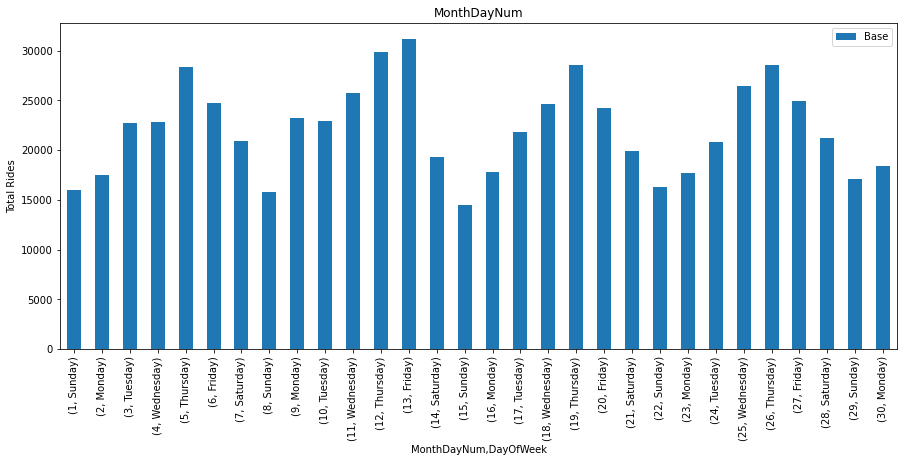

In [12]:
# visualize daily rides of the month

daily_uber_rides = jun.pivot_table(index=['MonthDayNum', 'DayOfWeek'], values='Base', aggfunc='count')
daily_uber_rides.plot(kind='bar',figsize=(15,6))
plt.ylabel('Total Rides')
plt.title('MonthDayNum')

# Thursdays and Fridays have the highest number of rides, and Sundays have the least

Text(0.5, 1.0, 'Days of the Week')

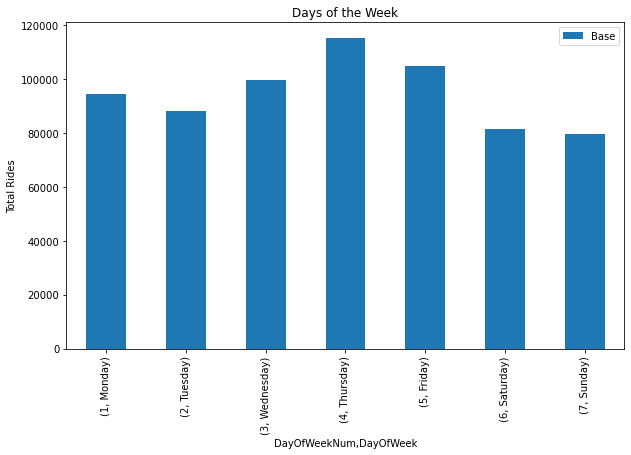

In [13]:
# visualize daily rides of a week

weekly_uber_rides = jun.pivot_table(index=['DayOfWeekNum','DayOfWeek'], values='Base', aggfunc='count')
weekly_uber_rides.plot(kind='bar',figsize=(10,6))
plt.ylabel('Total Rides')
plt.title('Days of the Week')

# # Thursdays and Fridays have the highest number of rides, and Sundays have the least

In [14]:
# groupby table (rides per day of the week)
daily_uber_rides = jun.groupby(['DayOfWeekNum','DayOfWeek'])['Base'].count()
daily_uber_rides = daily_uber_rides.reset_index()
daily_uber_rides

,DayOfWeekNum,DayOfWeek,Base
0,1,Monday,94655
1,2,Tuesday,88134
2,3,Wednesday,99654
3,4,Thursday,115325
4,5,Friday,105056
5,6,Saturday,81364
6,7,Sunday,79656


Text(0.5, 1.0, 'Rides by Hour')

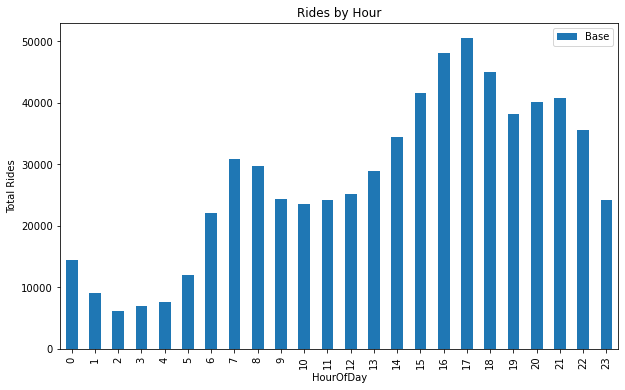

In [15]:
# check rides of each hour

hour_rides = jun.pivot_table(index=['HourOfDay'], values='Base', aggfunc='count')
hour_rides.plot(kind='bar', figsize=(10,6))
plt.ylabel('Total Rides')
plt.title('Rides by Hour')

# peaks can be observed during commute hours 7H-9H and after 15H

In [16]:
# groupby table (rides per hour of the day)
hour_rides = jun.groupby(['HourOfDay'])['Base'].count()
hour_rides = hour_rides.reset_index()
hour_rides

,HourOfDay,Base
0,0,14514
1,1,9167
2,2,6189
3,3,6937
4,4,7701
5,5,11955
6,6,22030
7,7,30834
8,8,29771
9,9,24298


In [17]:
jun['Base'].unique()

array(['B02512', 'B02598', 'B02617', 'B02682', 'B02764'], dtype=object)

In [18]:
jun = jun.astype({"HourOfDay": str}, errors='raise') 

jun['Time'] = jun[['DayOfWeek', 'HourOfDay']].agg('-'.join, axis=1)

In [19]:
jun

,Date/Time,Lat,Lon,Base,date,month,week,MonthDayNum,HourOfDay,DayOfWeekNum,DayOfWeek,Time
0,2014-06-01 00:00:00,40.7293,-73.9920,B02512,2014-06-01,6,22,1,0,7,Sunday,Sunday-0
1,2014-06-01 00:01:00,40.7131,-74.0097,B02512,2014-06-01,6,22,1,0,7,Sunday,Sunday-0
2,2014-06-01 00:04:00,40.3461,-74.6610,B02512,2014-06-01,6,22,1,0,7,Sunday,Sunday-0
3,2014-06-01 00:04:00,40.7555,-73.9833,B02512,2014-06-01,6,22,1,0,7,Sunday,Sunday-0
4,2014-06-01 00:07:00,40.6880,-74.1831,B02512,2014-06-01,6,22,1,0,7,Sunday,Sunday-0
...,...,...,...,...,...,...,...,...,...,...,...,...
663839,2014-06-30 22:40:00,40.7332,-73.9872,B02764,2014-06-30,6,27,30,22,1,Monday,Monday-22
663840,2014-06-30 23:12:00,40.7905,-73.9796,B02764,2014-06-30,6,27,30,23,1,Monday,Monday-23
663841,2014-06-30 23:13:00,40.7640,-73.9887,B02764,2014-06-30,6,27,30,23,1,Monday,Monday-23
663842,2014-06-30 23:15:00,40.7262,-73.9944,B02764,2014-06-30,6,27,30,23,1,Monday,Monday-23


In [20]:
jun_sample = jun.groupby('Time', group_keys=False).apply(lambda x: x.sample(min(len(x), 100)))
jun_sample

,Date/Time,Lat,Lon,Base,date,month,week,MonthDayNum,HourOfDay,DayOfWeekNum,DayOfWeek,Time
493068,2014-06-06 00:06:00,40.7394,-74.0072,B02682,2014-06-06,6,23,6,0,5,Friday,Friday-0
588949,2014-06-20 00:06:00,40.7092,-74.0134,B02682,2014-06-20,6,25,20,0,5,Friday,Friday-0
135431,2014-06-13 00:08:00,40.7388,-74.0386,B02598,2014-06-13,6,24,13,0,5,Friday,Friday-0
588958,2014-06-20 00:09:00,40.7418,-74.0048,B02682,2014-06-20,6,25,20,0,5,Friday,Friday-0
74284,2014-06-06 00:04:00,40.7719,-73.9902,B02598,2014-06-06,6,23,6,0,5,Friday,Friday-0
...,...,...,...,...,...,...,...,...,...,...,...,...
417887,2014-06-25 09:14:00,40.7500,-73.9749,B02617,2014-06-25,6,26,25,9,3,Wednesday,Wednesday-9
417870,2014-06-25 09:09:00,40.7434,-73.9839,B02617,2014-06-25,6,26,25,9,3,Wednesday,Wednesday-9
56394,2014-06-04 09:58:00,40.7738,-73.8712,B02598,2014-06-04,6,23,4,9,3,Wednesday,Wednesday-9
175812,2014-06-18 09:53:00,40.7104,-73.9662,B02598,2014-06-18,6,25,18,9,3,Wednesday,Wednesday-9


In [21]:
clusters = jun_sample[['Lat','Lon']]
clusters

,Lat,Lon
493068,40.7394,-74.0072
588949,40.7092,-74.0134
135431,40.7388,-74.0386
588958,40.7418,-74.0048
74284,40.7719,-73.9902
...,...,...
417887,40.7500,-73.9749
417870,40.7434,-73.9839
56394,40.7738,-73.8712
175812,40.7104,-73.9662


In [22]:
distortions = []
K = range(1, 15)
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(clusters)
    kmeanModel.fit(clusters)
 
    distortions.append(sum(np.min(cdist(clusters, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / clusters.shape[0])
 

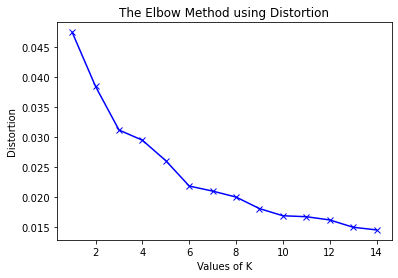

In [23]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

Take the k = 6

In [24]:
kmeans = KMeans(n_clusters=6, random_state=0).fit(clusters)
set(kmeans.labels_)

{0, 1, 2, 3, 4, 5}

In [25]:
jun_sample['labels'] = kmeans.labels_
jun_sample.labels.value_counts()

5    6967
2    6033
1    2170
0     805
4     616
3     209
Name: labels, dtype: int64

In [26]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import v_measure_score
dbscan_cluster = DBSCAN(eps=0.2)
dbscan_cluster.fit(clusters)
jun_sample['labels_DBSCAN'] = dbscan_cluster.labels_
jun_sample

,Date/Time,Lat,Lon,Base,date,month,week,MonthDayNum,HourOfDay,DayOfWeekNum,DayOfWeek,Time,labels,labels_DBSCAN
493068,2014-06-06 00:06:00,40.7394,-74.0072,B02682,2014-06-06,6,23,6,0,5,Friday,Friday-0,5,0
588949,2014-06-20 00:06:00,40.7092,-74.0134,B02682,2014-06-20,6,25,20,0,5,Friday,Friday-0,5,0
135431,2014-06-13 00:08:00,40.7388,-74.0386,B02598,2014-06-13,6,24,13,0,5,Friday,Friday-0,5,0
588958,2014-06-20 00:09:00,40.7418,-74.0048,B02682,2014-06-20,6,25,20,0,5,Friday,Friday-0,5,0
74284,2014-06-06 00:04:00,40.7719,-73.9902,B02598,2014-06-06,6,23,6,0,5,Friday,Friday-0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417887,2014-06-25 09:14:00,40.7500,-73.9749,B02617,2014-06-25,6,26,25,9,3,Wednesday,Wednesday-9,2,0
417870,2014-06-25 09:09:00,40.7434,-73.9839,B02617,2014-06-25,6,26,25,9,3,Wednesday,Wednesday-9,5,0
56394,2014-06-04 09:58:00,40.7738,-73.8712,B02598,2014-06-04,6,23,4,9,3,Wednesday,Wednesday-9,0,0
175812,2014-06-18 09:53:00,40.7104,-73.9662,B02598,2014-06-18,6,25,18,9,3,Wednesday,Wednesday-9,1,0


In [56]:
jun_sample.to_csv(r'/Users/tinghaokao/Desktop/Ironhack courses/Weekely_Projects/Project_8_Uber/Uber_Data/jun_sample.csv')

In [27]:
jun_sample['labels_DBSCAN'].value_counts()

 0    16794
-1        6
Name: labels_DBSCAN, dtype: int64

In [28]:
from sklearn import cluster, datasets, mixture
hc_dataset2 = cluster.AgglomerativeClustering(n_clusters=6, affinity='euclidean', 
                                              linkage='average').fit_predict(clusters)
print("Clusters")
print(["Cluster "+str(i)+": "+ str(sum(hc_dataset2==i)) for i in range(6)], sep='\n')

Clusters
['Cluster 0: 36', 'Cluster 1: 14', 'Cluster 2: 16744', 'Cluster 3: 2', 'Cluster 4: 2', 'Cluster 5: 2']


In [31]:
import folium

In [32]:
locations = jun_sample[['Lat','Lon','labels']]
map = folium.Map(location=[locations.Lat.mean(), locations.Lon.mean()], zoom_start=11, control_scale=True)

/var/folders/9y/45l79l3x40s95c93b61_6txw0000gn/T/ipykernel_10297/3416180562.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  locations['c'] = locations.labels.map({0:colors[0], 1:colors[1], 2:colors[2],3:colors[3],4:colors[4],5:colors[5]})


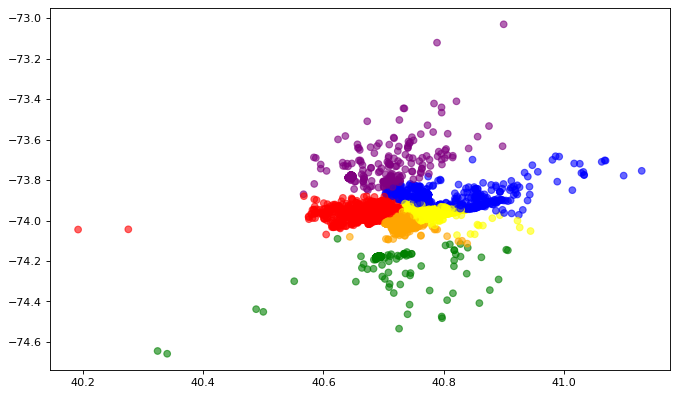

In [41]:
from matplotlib.pyplot import figure
figure(figsize=(10, 6), dpi=80)
colors = ['blue', 'red', 'yellow','green','purple','orange']
locations['c'] = locations.labels.map({0:colors[0], 1:colors[1], 2:colors[2],3:colors[3],4:colors[4],5:colors[5]})

plt.scatter(locations.Lat, locations.Lon, c=locations.c, alpha = 0.6)

In [34]:
locations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16800 entries, 493068 to 11470
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Lat     16800 non-null  float64
 1   Lon     16800 non-null  float64
 2   labels  16800 non-null  int32  
 3   c       16800 non-null  object 
dtypes: float64(2), int32(1), object(1)
memory usage: 590.6+ KB


In [35]:
import matplotlib.colors as colors
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for lat, lng, cluster in zip(locations['Lat'], locations['Lon'],  locations['labels']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map)
       

In [43]:
rainbow

['#8000ff', '#1996f3', '#4df3ce', '#b2f396', '#ff964f', '#ff0000']

In [36]:
map

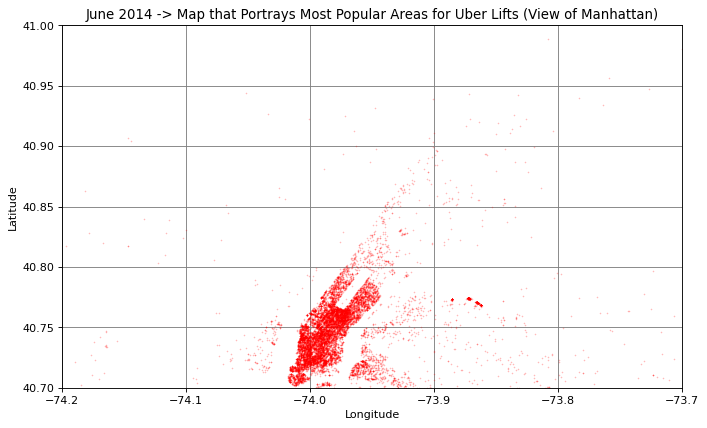

In [40]:
from matplotlib.pyplot import figure
figure(figsize=(10, 6), dpi=80)
plt.plot(locations['Lon'], locations['Lat'], '.', ms=.5, alpha=.5, c='r')
plt.xlim(-74.2, -73.7)
plt.ylim(40.7, 41)
plt.title('June 2014 -> Map that Portrays Most Popular Areas for Uber Lifts (View of Manhattan)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.grid(which='minor', c='lightgrey')
plt.grid(which='major', c='grey')

In [44]:
cluster_color = pd.DataFrame(jun_sample['labels'].value_counts())

In [48]:
cluster_color['color']=['red','light blue','ocean','violet','orange','green']

In [49]:
cluster_color

,labels,color
5,6967,red
2,6033,light blue
1,2170,ocean
0,805,violet
4,616,orange
3,209,green


(array([ 805.,    0., 2170.,    0., 6033.,    0.,  209.,    0.,  616.,
        6967.]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <BarContainer object of 10 artists>)

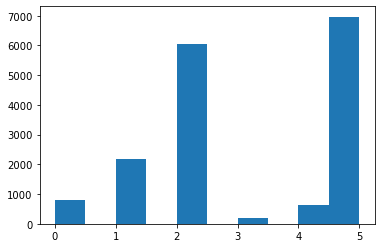

In [54]:
plt.hist(jun_sample['labels'])